In [1]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path

# Paths
MODEL_PATH   = Path("models")/"emotion_detector"/"weights"/"best.pt"
DEMO_DIR     = Path("../demo_images")           # put your 9 selfies here
OUTPUT_DIR   = Path("runs")/"inference_demo"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Load model
model = YOLO(str(MODEL_PATH))
print("✅ Loaded model:", MODEL_PATH)


WARNING ⚠️ torchvision==0.17 is incompatible with torch==2.3.
Run 'pip install torchvision==0.18' to fix torchvision or 'pip install -U torch torchvision' to update both.
For a full compatibility table see https://github.com/pytorch/vision#installation
✅ Loaded model: models\emotion_detector\weights\best.pt


In [2]:
img_paths = sorted(DEMO_DIR.glob("*.*"))
print(f"Found {len(img_paths)} demo images:")
for p in img_paths: print(" ", p.name)


Found 45 demo images:
  angry.jpeg
  angry1.jpeg
  angry_.jpeg
  angry_1.jpeg
  contempt.jpeg
  contempt1.jpeg
  contempt_.jpeg
  contempt_1.jpeg
  disgust.jpeg
  disgust1.jpeg
  disgust_.jpeg
  disgust_1.jpeg
  fear.jpeg
  fear1.jpeg
  fear_.jpeg
  fear_1.jpeg
  happy.jpeg
  happy1.jpeg
  happy_.jpeg
  happy_1.jpeg
  natural.jpeg
  natural1.jpeg
  natural_.jpeg
  natural_1.jpeg
  sad.jpeg
  sad1.jpeg
  sad2 (1).jpeg
  sad2 (2).jpeg
  sad2 (3).jpeg
  sad2 (4).jpeg
  sad2 (5).jpeg
  sad2 (6).jpeg
  sad2 (7).jpeg
  sad_.jpeg
  sad_1.jpeg
  sleepy.jpeg
  sleepy1.jpeg
  sleepy_.jpeg
  sleepy_1 (1).jpeg
  sleepy_1 (2).jpeg
  sleepy_1 (3).jpeg
  surprised.jpeg
  surprised1.jpeg
  surprised_.jpeg
  surprised_1.jpeg


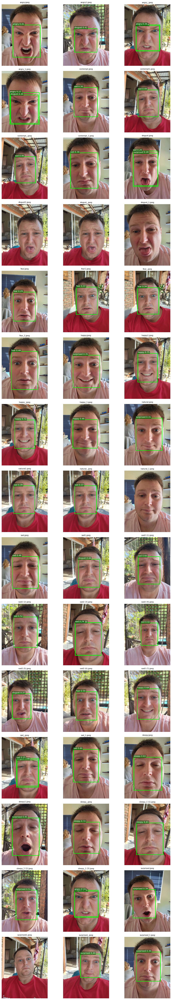

In [3]:
import math
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# assume model, img_paths, OUTPUT_DIR already defined

# how many images?
n = len(img_paths)
cols = 3                   # 3 across
rows = math.ceil(n/cols)   # as many rows as needed

fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
axes = axes.flatten()

for ax, img_p in zip(axes, img_paths):
    # 1) read & run inference
    img = cv2.imread(str(img_p))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    res = model.predict(
        str(img_p),
        conf=0.25,
        iou=0.45,
        imgsz=640,
        verbose=False
    )[0]

    # 2) sort detections by confidence desc
    confs = res.boxes.conf.cpu().numpy()
    clss  = res.boxes.cls.cpu().numpy().astype(int)
    if len(confs):
        idxs = confs.argsort()[::-1][:2]  # top 2
    else:
        idxs = []

    # 3) draw the top 2 boxes
    for i in idxs:
        x1,y1,x2,y2 = res.boxes.xyxy[i].cpu().numpy().astype(int)
        cls   = clss[i]
        conf  = confs[i]
        name  = model.names[cls]
        # box
        ax.add_patch(plt.Rectangle(
            (x1,y1), x2-x1, y2-y1,
            edgecolor="lime", facecolor="none", linewidth=2
        ))
        # label
        ax.text(
            x1, y1-6,
            f"{name} {conf:.2f}",
            color="white",
            fontsize=9,
            bbox=dict(facecolor="darkgreen", alpha=0.6, pad=1)
        )

    # 4) show
    ax.imshow(img_rgb)
    ax.set_title(img_p.name, fontsize=8)
    ax.axis("off")

# hide any extra subplots
for ax in axes[n:]:
    ax.axis("off")

plt.tight_layout()
plt.show()
